In [1]:
# Nativos
import os
import sys

#calculo
import numpy as np
import pandas as pd
from IPython.display import display

#grafico
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style="whitegrid")

#warning ignore future
import warnings
warnings.filterwarnings('ignore')

from extract import Extract

### OJO: Apesar de tener data hasta 03/02/2019, solo se manejara hasta el 27/01/2019 con fines de poder comparar los resultados de ambos modelos

In [2]:
df = pd.read_excel(
    'https://s3.amazonaws.com/amp.ec/peru21_new.xlsx', parse_dates=['Fecha']
).sort_index()

df.index = df['Fecha']
del df.index.name
df.head()

,Dia,Mes,Año,Producto,Fecha,CodigoSapAgencia,NombreAgencia,CodigoSapCanilla,NombreCanilla,Pauta,Devolucion,VentaNeta,Lim Inf,Proy Holt,Lim Sup
2018-01-01,lunes,Enero,2018,Peru 21,2018-01-01,1200000047,JESUS MARIA,1300000086,AGUIRRE MANRIQUE CLAUDIA,25.0,0.0,25.0,NaN,NaN,NaN
2018-01-01,lunes,Enero,2018,Peru 21,2018-01-01,1200000047,JESUS MARIA,1300000087,AGUIRRE MANRRIQUE JUAN BAUTISTA,19.0,1.0,18.0,NaN,NaN,NaN
2018-01-01,lunes,Enero,2018,Peru 21,2018-01-01,1200000047,JESUS MARIA,1300000088,AGUIRRE MANRRIQUE MARISA QYSIRE,7.0,1.0,6.0,NaN,NaN,NaN
2018-01-01,lunes,Enero,2018,Peru 21,2018-01-01,1200000047,JESUS MARIA,1300000279,ALVAREZ SOTO JUAN DE DIOS,0.0,0.0,0.0,NaN,NaN,NaN
2018-01-01,lunes,Enero,2018,Peru 21,2018-01-01,1200000047,JESUS MARIA,1300000530,ARREDONDO MOLINA MAURA SANTA PAULINA,12.0,3.0,9.0,NaN,NaN,NaN


OBSERVACION, por casos de datos faltantes

In [3]:
df[df['CodigoSapCanilla'] == 1300000384][['Pauta', 'VentaNeta', 'Proy Holt']].tail()

,Pauta,VentaNeta,Proy Holt
2019-01-20,2.0,1.0,NaN
2019-01-21,1.0,0.0,0.000000
2019-01-27,2.0,1.0,1.053747
2019-01-28,NaN,NaN,0.000000
2019-01-29,NaN,NaN,0.000000


Filtrado

In [4]:
df = df[(df['Pauta'] > 0) | (df['VentaNeta'].notnull())]

No se descarta todos los valores donde la pauta es nula (AUSENCIA DE CANILLA), para analizar la variacion del pronostico considereando estos dias de falta entre el 21 y el 27 de Enero

## Validacion de nulos Globales

In [5]:
df.isnull().sum(), df.shape

(Dia                      0
 Mes                      0
 Año                      0
 Producto                 0
 Fecha                    0
 CodigoSapAgencia         0
 NombreAgencia            0
 CodigoSapCanilla         0
 NombreCanilla            0
 Pauta                    0
 Devolucion               0
 VentaNeta                0
 Lim Inf             285015
 Proy Holt           285015
 Lim Sup             285015
 dtype: int64, (289391, 15))

## Configuracion

In [6]:
init_prediction = '2019-01-21'
since_date = '2019-01-20'

In [7]:
agencias_detectadas = df.groupby(by=['NombreAgencia'])['CodigoSapAgencia'].max()
agencias_detectadas

NombreAgencia
CALLAO          1200000065
CANTO GRANDE    1200001015
JESUS MARIA     1200000047
LINCE           1200000026
LOS OLIVOS      1200000077
MIRAFLORES 1    1200000044
Name: CodigoSapAgencia, dtype: int64

## Creación de contenedor de caniilas por agencia

In [8]:
def is_not_nan(val):
    return str(val).lower() != 'nan'

def calc_mean_weekday(data, val, col, fecha, num_previous=3):
    """
    data = Datframe global
    val = valor numérico del dia de semana
    col = columna a hallar promedio segun día de semana
    fecha = Se tomará el promedio a los dias posteriores a este valor
    """
    mean = data[
        (data['weekday'] == val) &              # Match dia de semana
        (str(data[col]).lower() != 'nan') &     # No se toma en cuenta los valores nulos
        (data['Pauta'] > 0)                     # No se toma en cuenta días de ausencia
    ][col][:fecha].values[
        -1*num_previous:].mean()  # Se trunca la fecha y se toma los 3 días de semana posteriores 
    
    # Se toma cero para los casos de faltas consecutivas el mismo dia de semana
    return mean if str(mean).lower() != 'nan' else 0 


class MYExtract(Extract):
    def get_data_pauta_weekday(self, code, num_previous=3, since='2019-01-20'):
        
        # Obtenemos las columnas de VEntaNeta y Pauta asociadas al canilla hasta 20/01/2019
        data = self.data[
            self.data['CodigoSapCanilla'] == code
        ][['VentaNeta', 'Pauta', 'Fecha']][:since].copy()
        
        # Deteccion de casos con demasiadas ausencias
        if data[data['Pauta'] == 0].shape[0] / data.shape[0] > 0.5:
            return 'Cantidad de ausencia supera el 50% de casos reportados'
        
        # Creamos una columa que indique el dia de semana
        data['weekday'] = data['Fecha'].dt.weekday

        # Asignamos nulo a los valores de fecha de dias de ausencia
        data['VentaNeta'] = data[['Pauta', 'VentaNeta']].apply(
            lambda _: _['VentaNeta'] if _['Pauta'] > 0 else np.nan, 
            axis=1
        )
        
        # Reemplazamos los nulos con el promedio de los 3 ultimos mismos dias de semana
        return data['VentaNeta'].fillna(
            data[['weekday', 'Fecha']].apply(lambda _: calc_mean_weekday(
                data,
                _['weekday'], 
                'VentaNeta',
                _['Fecha'],
                num_previous=num_previous
            ), axis=1)
        )
    
    def populate_data(self, code_agencia, num_previous=3, since='2019-01-20'):
        lista_canillas = set(
            self.data[self.data['CodigoSapAgencia'] == code_agencia]['CodigoSapCanilla'].unique()
        )
        print('Total canillas en agencia: ', len(lista_canillas))
        
        lista_canillas = lista_canillas.intersection(self.unique_canillas)
        print('Canillas en agencia con ultimos datos no nulos: ', len(lista_canillas))
        
        dicc = {}
        for canilla in lista_canillas:
            response = self.get_data_pauta_weekday(canilla, num_previous=num_previous, since=since)
            if isinstance(response, str):
                print("\n DETECCION DE CASO INVALIDO ", canilla)
                print(response)
                fig, axes = plt.subplots(nrows=1, ncols=1)
                self.data[self.data['CodigoSapCanilla'] == canilla]['VentaNeta'].plot(
                    legend=True, ax=axes, title=canilla)
                print('/'*30)
            else:
                dicc[canilla] = {'data': response}
        
        for k, v in dicc.items():
            fig, axes = plt.subplots(nrows=1, ncols=1)
            v.get('data').plot(legend=True, ax=axes, title=k)
            self.data[self.data['CodigoSapCanilla'] == k]['VentaNeta'].plot(legend=True, ax=axes)
        return dicc

In [9]:
extractor = MYExtract(df)

Total canillas:  764
Ultima fecha detectada:  2019-01-27
Canillas con ultimas datos no nulos:  560


### CALLAO

Total canillas en agencia:  161
Canillas en agencia con ultimos datos no nulos:  127

 DETECCION DE CASO INVALIDO  1300013878
Cantidad de ausencia supera el 50% de casos reportados
//////////////////////////////

 DETECCION DE CASO INVALIDO  1300007778
Cantidad de ausencia supera el 50% de casos reportados
//////////////////////////////


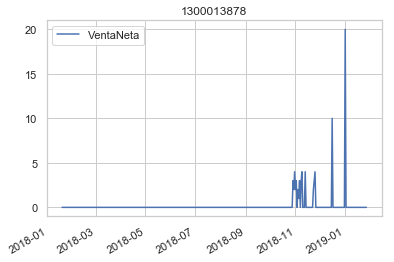

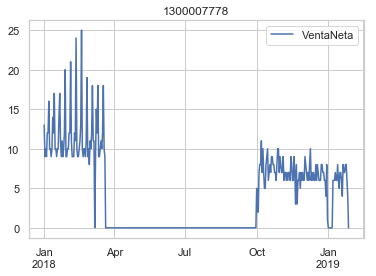

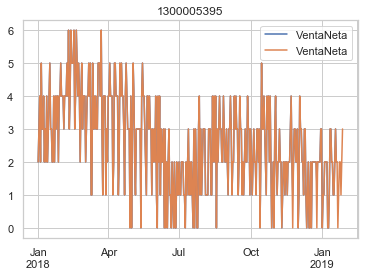

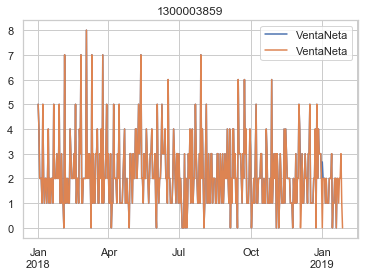

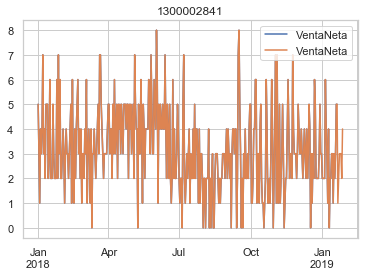

...

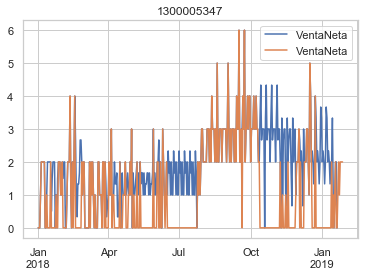

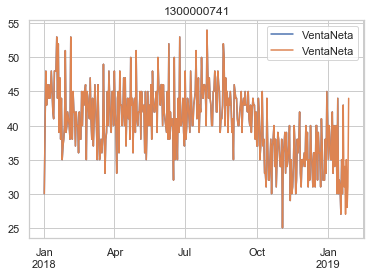

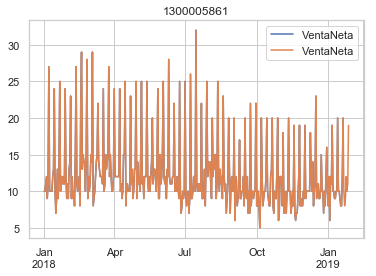

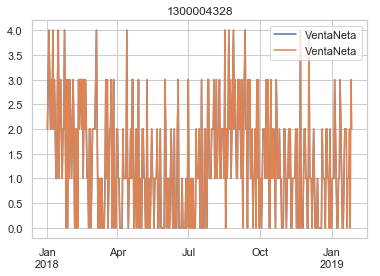

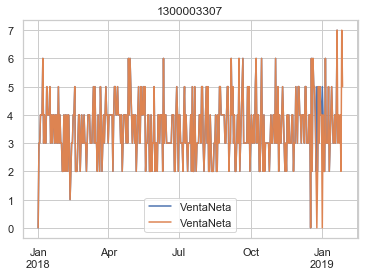

In [10]:
dicc_callao = extractor.populate_data(1200000065)

In [11]:
extractor.inspect_dict(dicc_callao, n=3, init=init_prediction)

Canilla:  1300005395


,Pauta,VentaNeta,Proy Holt
2019-01-21,3.0,0.0,2.213971
2019-01-22,2.0,1.0,1.255578
2019-01-23,2.0,2.0,1.360651
2019-01-24,2.0,2.0,1.591688
2019-01-25,4.0,1.0,2.339131
2019-01-26,3.0,2.0,1.414549
2019-01-27,3.0,3.0,1.766914


Canilla:  1300003859


,Pauta,VentaNeta,Proy Holt
2019-01-21,2.0,2.0,1.650146
2019-01-22,4.0,1.0,1.740309
2019-01-23,4.0,2.0,1.393745
2019-01-24,4.0,2.0,1.679151
2019-01-25,4.0,3.0,2.020240
2019-01-26,4.0,1.0,1.480613
2019-01-27,0.0,0.0,2.701819


Canilla:  1300002841


,Pauta,VentaNeta,Proy Holt
2019-01-21,5.0,1.0,3.097711
2019-01-22,3.0,2.0,1.299859
2019-01-23,5.0,3.0,2.175476
2019-01-24,5.0,3.0,1.598615
2019-01-25,5.0,3.0,2.112818
2019-01-26,6.0,2.0,4.178011
2019-01-27,6.0,4.0,4.721638


In [12]:
extractor.valid_null(dicc_callao)


 0 nulos detectados


### CANTO GRANDE

Total canillas en agencia:  72
Canillas en agencia con ultimos datos no nulos:  61

 DETECCION DE CASO INVALIDO  1300013749
Cantidad de ausencia supera el 50% de casos reportados
//////////////////////////////

 DETECCION DE CASO INVALIDO  1300012514
Cantidad de ausencia supera el 50% de casos reportados
//////////////////////////////


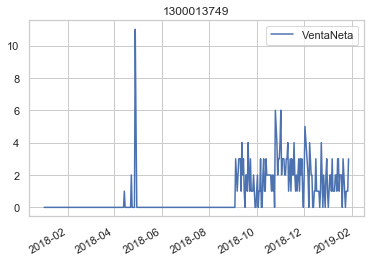

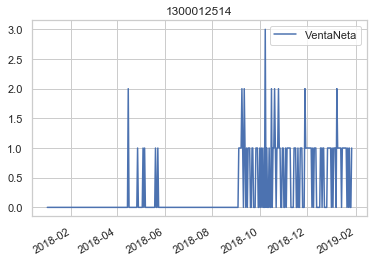

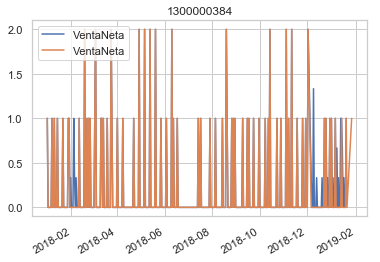

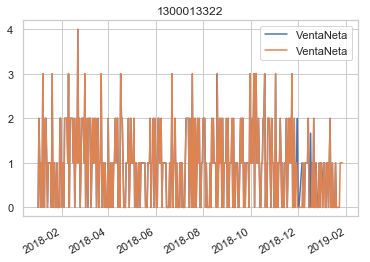

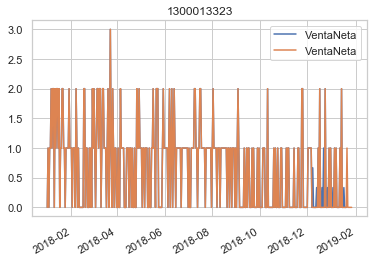

...

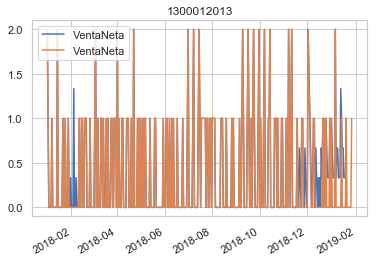

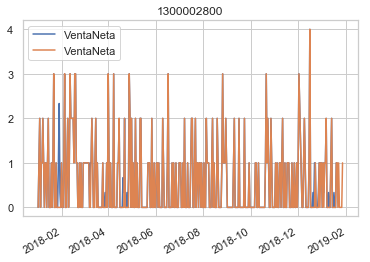

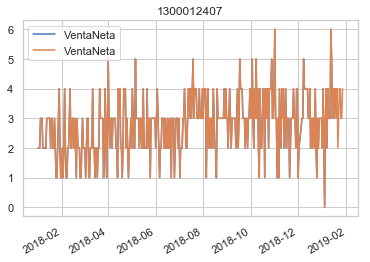

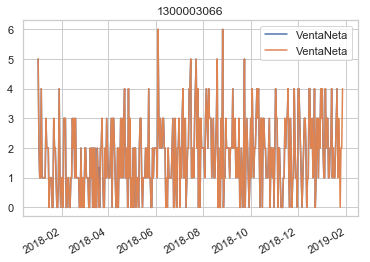

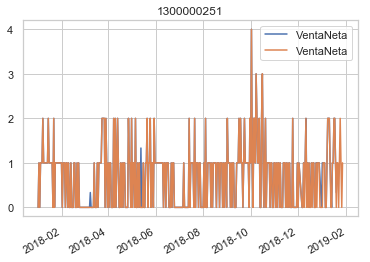

In [13]:
dicc_canto_grande = extractor.populate_data(1200001015)

In [14]:
extractor.inspect_dict(dicc_canto_grande, n=3, init=init_prediction)

Canilla:  1300000384


,Pauta,VentaNeta,Proy Holt
2019-01-21,1.0,0.0,0.000000
2019-01-27,2.0,1.0,1.053747


Canilla:  1300013322


,Pauta,VentaNeta,Proy Holt
2019-01-21,2.0,0.0,0.765899
2019-01-22,1.0,0.0,0.712159
2019-01-23,1.0,0.0,0.839440
2019-01-24,1.0,1.0,0.804227
2019-01-25,3.0,1.0,1.673829
2019-01-27,2.0,1.0,0.330931


Canilla:  1300013323


,Pauta,VentaNeta,Proy Holt
2019-01-21,2.0,1.0,0.826139
2019-01-22,1.0,0.0,0.111312
2019-01-23,1.0,0.0,0.045993
2019-01-24,0.0,0.0,0.070596
2019-01-25,0.0,0.0,0.219106
2019-01-26,2.0,0.0,0.383052
2019-01-27,0.0,0.0,0.599464


In [15]:
extractor.valid_null(dicc_canto_grande)


 0 nulos detectados


### JESUS MARIA

Total canillas en agencia:  157
Canillas en agencia con ultimos datos no nulos:  112


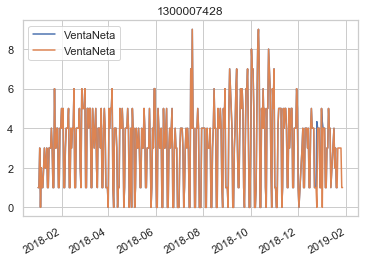

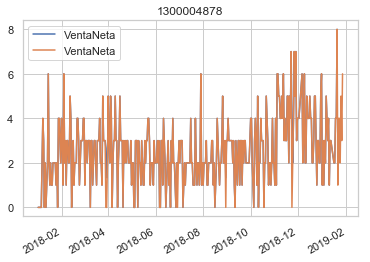

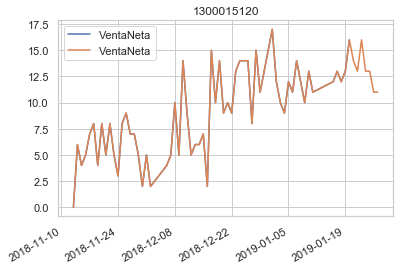

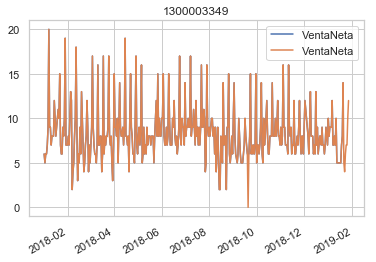

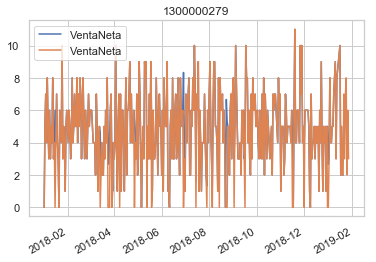

...

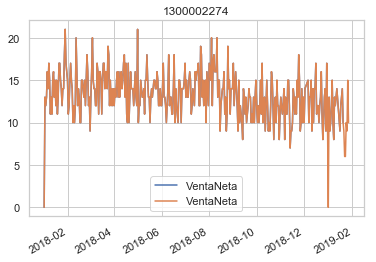

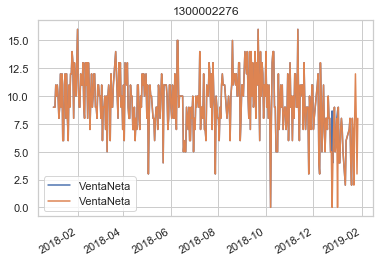

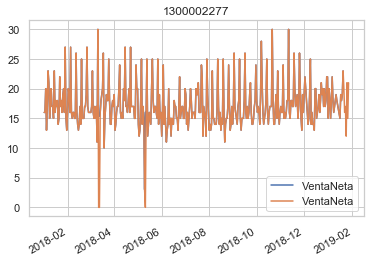

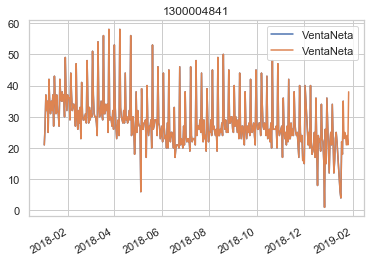

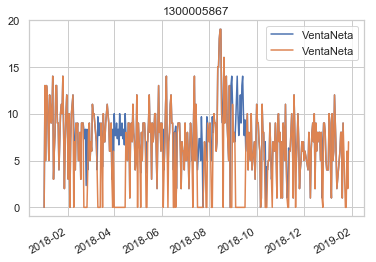

In [16]:
dicc_jesus_maria = extractor.populate_data(1200000047)


In [17]:
extractor.inspect_dict(dicc_jesus_maria, n=3, init=init_prediction)

Canilla:  1300007428


,Pauta,VentaNeta,Proy Holt
2019-01-21,5.0,3.0,4.261950
2019-01-22,5.0,3.0,4.466955
2019-01-23,5.0,3.0,4.988841
2019-01-24,5.0,3.0,4.194997
2019-01-25,3.0,3.0,3.976617
2019-01-26,1.0,1.0,0.908892
2019-01-27,1.0,1.0,0.679658


Canilla:  1300004878


,Pauta,VentaNeta,Proy Holt
2019-01-21,9.0,1.0,2.912770
2019-01-22,8.0,4.0,2.283530
2019-01-23,4.0,4.0,3.272526
2019-01-24,7.0,2.0,1.881683
2019-01-25,6.0,5.0,3.399332
2019-01-26,7.0,3.0,2.694407
2019-01-27,6.0,6.0,5.014136


Canilla:  1300015120


,Pauta,VentaNeta,Proy Holt
2019-01-21,16.0,14.0,9.877770
2019-01-22,16.0,13.0,10.247999
2019-01-23,16.0,16.0,9.219352
2019-01-24,16.0,13.0,8.044932
2019-01-25,15.0,13.0,8.182497
2019-01-26,11.0,11.0,8.600354
2019-01-27,11.0,11.0,8.857666


In [18]:
extractor.valid_null(dicc_jesus_maria)


 0 nulos detectados


### VISUALIZACION POR PERCENTILES

### CALLAO

In [19]:
extractor.show_percentile(dicc_callao)

,1,3,5,10,20,30,50,60,70,80,90,95,97,99
0,0.00,0.00,0.0,1.00,1.00,2.00,3.0,3.0,3.00,4.0,4.0,5.00,5.00,6.00
1,0.00,0.00,0.2,1.00,1.00,1.00,2.0,2.0,3.00,3.0,4.0,5.00,5.00,7.00
2,0.00,0.00,1.0,1.00,2.00,2.00,3.0,4.0,4.00,5.0,5.0,6.00,7.00,7.00
3,1.00,2.00,2.0,3.00,4.00,5.00,6.0,6.0,7.00,7.0,8.0,9.00,9.00,10.00
4,0.00,0.00,0.0,0.00,1.00,1.00,2.0,2.0,2.00,3.0,4.0,4.00,4.00,5.00
5,0.00,0.00,0.0,0.00,0.00,0.00,1.0,1.0,2.00,2.0,2.0,3.00,3.00,4.00
6,0.00,0.00,0.0,1.00,1.00,1.67,2.0,2.0,3.00,3.0,4.0,4.00,5.00,6.00
7,0.00,0.00,1.0,1.00,2.00,2.00,3.0,3.0,4.00,4.2,5.0,6.00,7.00,9.00
8,8.52,10.00,12.0,13.00,14.00,14.00,15.0,16.0,16.00,18.0,20.0,21.00,21.00,23.00
9,2.00,2.52,3.0,3.00,3.00,4.00,4.0,5.0,5.00,5.0,6.0,7.00,8.00,8.16


### CANTO GRANDE

In [20]:
extractor.show_percentile(dicc_canto_grande)

,1,3,5,10,20,30,50,60,70,80,90,95,97,99
0,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.33,1.00,1.00,2.00,2.00
1,0.0,0.0,0.00,0.0,0.00,0.00,1.00,1.00,1.00,2.00,2.00,2.00,3.00,3.00
2,0.0,0.0,0.00,0.0,0.00,0.00,1.00,1.00,1.00,1.00,2.00,2.00,2.00,2.00
3,0.0,0.0,0.00,0.0,0.00,0.00,0.33,1.00,1.00,1.00,1.00,2.00,2.00,3.00
4,0.0,0.0,0.00,1.0,2.00,2.00,3.00,3.00,3.00,4.00,4.00,5.00,5.00,6.00
5,0.0,0.0,0.00,0.0,0.00,0.00,1.00,1.00,1.00,2.00,2.00,2.00,2.00,2.37
6,0.0,0.0,0.00,0.0,1.00,1.00,1.83,2.00,2.00,3.00,4.00,4.95,5.00,6.00
7,0.0,0.0,0.00,0.0,1.00,1.00,2.00,2.00,3.00,3.00,4.00,5.00,6.00,7.00
8,0.0,1.0,2.00,2.0,3.00,4.00,5.00,5.00,6.00,6.00,8.00,9.00,10.00,10.19
9,0.0,0.0,0.00,0.0,0.00,1.00,1.00,1.00,2.00,2.00,3.00,3.00,3.00,4.00


### JESUS MARIA

In [21]:
extractor.show_percentile(dicc_jesus_maria)

,1,3,5,10,20,30,50,60,70,80,90,95,97,99
0,0.00,0.00,0.00,0.00,1.0,1.00,4.00,4.00,4.00,5.00,5.00,6.00,7.00,8.00
1,0.00,0.00,0.00,1.00,1.0,2.00,2.00,3.00,3.00,4.00,4.00,5.00,6.00,6.23
2,1.22,2.00,2.05,4.00,5.0,6.30,9.00,10.00,12.00,13.00,14.00,15.00,15.17,16.39
3,2.77,4.00,5.00,6.00,6.0,7.00,8.00,8.00,9.00,10.00,12.00,15.00,16.00,17.23
4,0.00,1.00,1.00,2.00,3.0,4.00,5.00,5.00,6.00,7.00,8.00,9.00,9.00,10.00
5,4.00,7.00,8.00,9.00,9.0,10.00,11.00,12.00,12.00,13.00,15.00,16.00,16.00,17.23
6,0.77,1.00,1.00,2.00,2.0,2.00,3.00,3.00,3.00,4.00,4.00,5.00,5.90,7.00
7,12.77,14.00,14.00,15.00,16.0,17.00,19.00,19.00,20.00,22.00,29.00,32.00,33.69,36.00
8,0.00,1.00,1.00,2.00,3.0,4.00,5.00,5.00,6.00,6.00,7.00,8.00,8.34,10.23
9,4.00,6.00,7.00,8.00,9.0,11.00,13.00,14.00,15.00,16.00,17.00,18.00,19.00,20.00


De los graficos generales de los datos se toma la decision de tomar los percentiles
5% y 95%

In [22]:
%%time
cut_up = 95/100
cut_down = 5/100

dicc_callao = extractor.noise_control(dicc_callao, cut_down, cut_up)
dicc_canto_grande = extractor.noise_control(dicc_canto_grande, cut_down, cut_up)
dicc_jesus_maria = extractor.noise_control(dicc_jesus_maria, cut_down, cut_up)

CPU times: user 318 ms, sys: 3.88 ms, total: 322 ms
Wall time: 320 ms


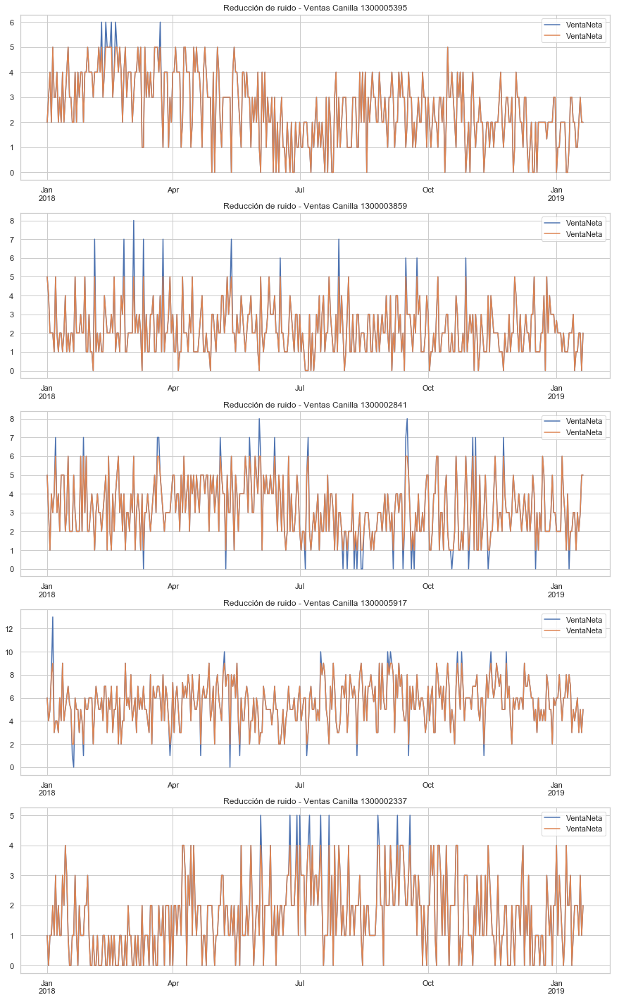

In [23]:
extractor.plot_diff_noise(dicc_callao, n=5)

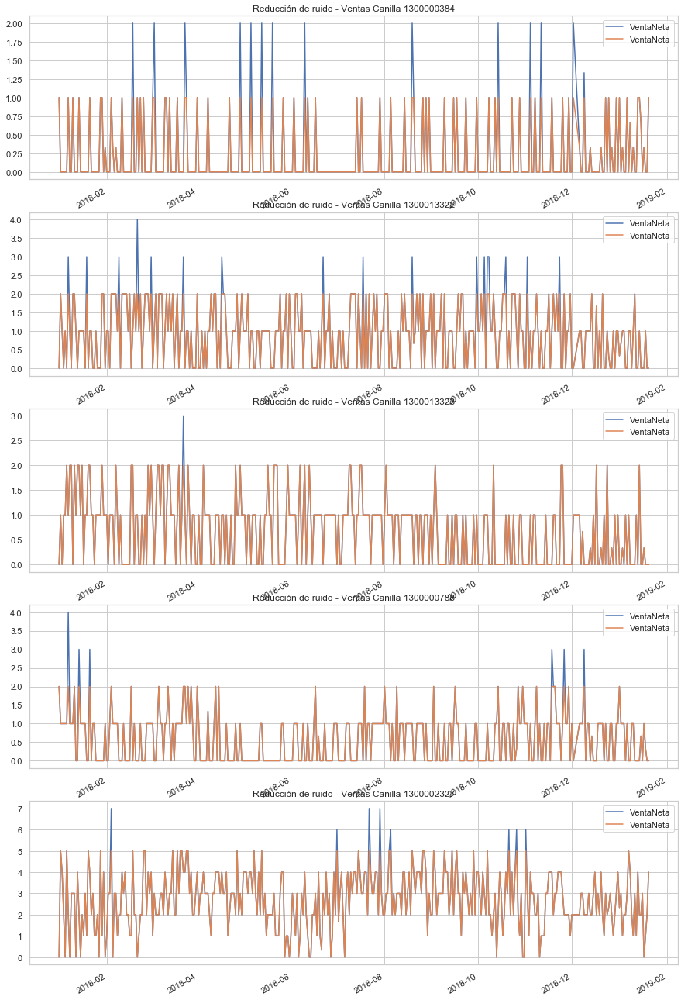

In [24]:
extractor.plot_diff_noise(dicc_canto_grande, n=5)

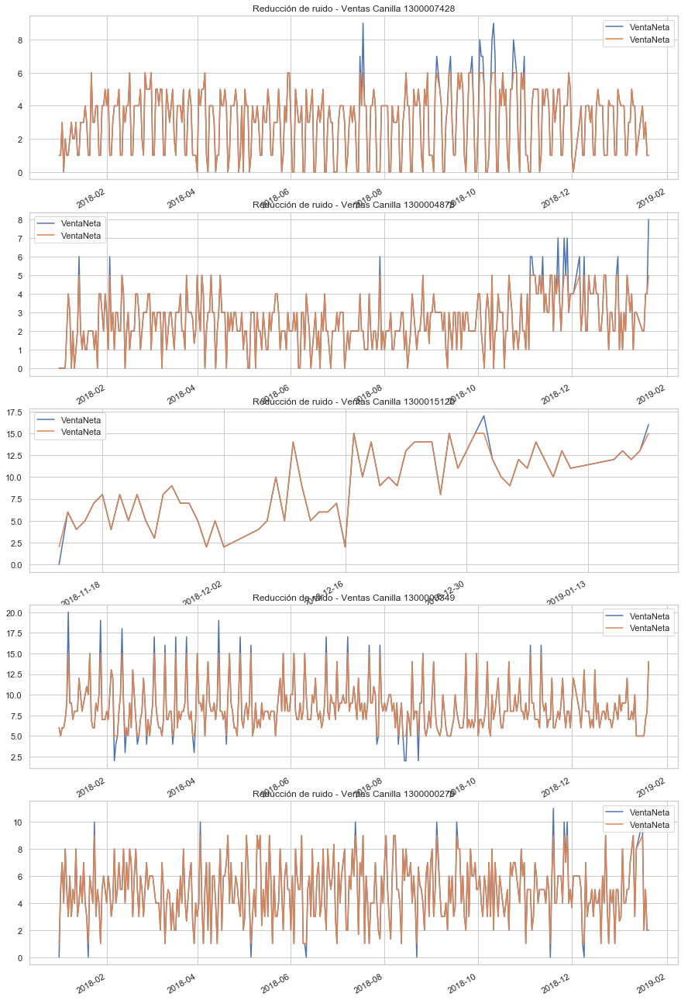

In [25]:
extractor.plot_diff_noise(dicc_jesus_maria, n=5)

# MODELADO DE DATOS

In [26]:
from statsmodels.tsa.arima_model import ARIMA
from itertools import product

In [27]:
from statsmodels.tsa.arima_model import ARIMA
from itertools import product

ps = range(2, 5)
d=1 
qs = range(2, 5)
Ps = range(0, 2)
D=1 
Qs = range(0, 2)
s = 7 # Semanal

parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [28]:
def compare_result(data, codigo_canilla, result, order, axes):
    # los 7 ultimos rsultados 
    new_result = pd.DataFrame(result)
    new_result.columns = ['HotlWinters_New']
    # new_result['HotlWinters_New'][6] += 0.5
    new_result['order'] = new_result.index
    
    # resultados holt del 21 al 27
    old_result = pd.DataFrame(data[data['CodigoSapCanilla'] == codigo_canilla][
        ['VentaNeta', 'Proy Holt']]['2019-01-21':'2019-01-27']
    )
    old_result['order'] = [int(str(_).split(' ')[0][-1])-1 for _ in old_result.index]
    old_result['date'] = old_result.index
    
    old_result['VentaNeta']  =  old_result['VentaNeta'].apply(
        lambda _: 0 if str(_).lower() == 'nan' else _)
    
    result = pd.merge(new_result, old_result, on='order', how='inner')
    #result.index = save_index
    result['diff_venta_holt'] = result['VentaNeta'] - result['Proy Holt']
    result['diff_venta_holtwinters'] = result['VentaNeta'] - result['HotlWinters_New']
    result.index = result.date
    del result['date']
    del result['order']
    
    result['round_ProyHolt'] = result['Proy Holt'].apply(lambda _: round(_) if _ > 0 else 0)
    result['round_HoltWinters'] = result['HotlWinters_New'].apply(lambda _: round(_) if _ > 0 else 0)
    
    result['diff_int_ventaholt'] = result['VentaNeta'] - result['round_ProyHolt']
    result['diff_int_ventawinters'] = result['VentaNeta'] - result['round_HoltWinters']    
        
    print('/'*10, "SUMA DE ERRORES", '/'*10, 
          data[data['CodigoSapCanilla'] == codigo_canilla]['NombreAgencia'].unique(),
          codigo_canilla)
    
    print("PROY HOLT___ decimal: {}  , entera: {}".format(
        sum(np.abs(result['diff_venta_holt'])), sum(np.abs(result['diff_int_ventaholt']))
    ))
    
    print("HOLT WINTERS___ decimal: {}  , entera: {}".format(
        sum(np.abs(result['diff_venta_holtwinters'])), sum(np.abs(result['diff_int_ventawinters']))
    ))
    result['Proy Holt'].plot(legend=True, ax=axes[order], title=str(codigo_canilla))
    result['HotlWinters_New'].plot(legend=True, ax=axes[order])
    result['VentaNeta'].plot(legend=True, ax=axes[order])
    display(result)
    return result, sum(np.abs(result['diff_int_ventaholt'])), sum(np.abs(result['diff_int_ventawinters']))

In [29]:
from tqdm import tqdm_notebook
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')

def optimizeSARIMA(data, parameters_list, d, D, s):
    try:
        results = []
        best_bic = float("inf")

        for param in tqdm_notebook(parameters_list):

            try:
                model=sm.tsa.statespace.SARIMAX(
                    data, 
                    order=(param[0], d, param[1]),
                    seasonal_order=(param[2], D, param[3], s),
                    enforce_stationarity=False,
                    enforce_invertibility=False
                ).fit(disp=-1)
            except:
                continue
            bic = model.bic

            if bic < best_bic:
                best_model = model
                best_bic = bic
                best_param = param
            results.append([param, model.bic])

        print(type(results), len(results))
        result_table = pd.DataFrame(results)
        result_table.columns = ['parameters', 'bic']

        result_table = result_table.sort_values(
            by='bic', ascending=True
        ).reset_index(drop=True)

        return result_table.parameters[0]
    except Exception as e:
        print("ERROR:::::: ", str(e))
        return 0, 0, 0, 0

## CANTO GRANDE

In [30]:
%%time
from tqdm import tqdm_notebook

for k, v in dicc_canto_grande.items():
    v['data_cut'] = v.get('data_cut').apply(lambda val: 0.1 if val <= 0 else val)
    
    p, q, P, Q = optimizeSARIMA(
        v.get('data_cut'), parameters_list, d, D, s)
    
    if not all([p, q, P, Q]):
        print("ERROR EN METODO ", k)
        continue
        
    print("Canilla : ", k, " --> ", p, ' 1 ', q, P,' 1 ', Q, s)
    model = sm.tsa.statespace.SARIMAX(
         v.get('data_cut'), order=(p, d, q), seasonal_order=(P, D, Q, s),
        enforce_stationarity=False,
                                            enforce_invertibility=False
    ).fit()
    
    lendata = v.get('data_cut').shape[0]
    forecast = model.predict(start=lendata, end=lendata + 6)
    display(forecast)
    v['result'] = forecast


<class 'list'> 24
ERROR EN METODO  1300000384



<class 'list'> 12
ERROR EN METODO  1300013322



<class 'list'> 24
ERROR EN METODO  1300013323



<class 'list'> 20
ERROR EN METODO  1300000788



<class 'list'> 20
ERROR EN METODO  1300002327



<class 'list'> 24
ERROR EN METODO  1300006551



<class 'list'> 36
Canilla :  1300013593  -->  2  1  3 1  1  1 7


382    0.191592
383    0.201857
384    1.364275
385    0.272179
386    0.105531
387    0.428416
388    1.786302
dtype: float64


<class 'list'> 32
Canilla :  1300013082  -->  2  1  2 1  1  1 7


382    1.440979
383    1.506289
384    2.784412
385    1.644538
386    1.293183
387    1.571023
388    1.225312
dtype: float64


<class 'list'> 28
ERROR EN METODO  1300013083



<class 'list'> 20
ERROR EN METODO  1300005532



<class 'list'> 24
ERROR EN METODO  1300013085



<class 'list'> 32
ERROR EN METODO  1300013084



<class 'list'> 24
ERROR EN METODO  1300011165



<class 'list'> 20
ERROR EN METODO  1300011681



<class 'list'> 24
ERROR EN METODO  1300001442



<class 'list'> 20
Canilla :  1300014256  -->  3  1  2 1  1  1 7


236    0.403829
237    1.005105
238    0.240577
239    0.275928
240    0.162534
241    2.619395
242    0.351789
dtype: float64


<class 'list'> 20
ERROR EN METODO  1300012601



<class 'list'> 19
ERROR EN METODO  1300002875



<class 'list'> 31
ERROR EN METODO  1300001339



<class 'list'> 12
ERROR EN METODO  1300003647



<class 'list'> 24
ERROR EN METODO  1300011329



<class 'list'> 32
ERROR EN METODO  1300011330



<class 'list'> 24
ERROR EN METODO  1300012227



<class 'list'> 32
ERROR EN METODO  1300012228



<class 'list'> 12
ERROR EN METODO  1300006085



<class 'list'> 28
ERROR EN METODO  1300012232



<class 'list'> 16
ERROR EN METODO  1300012233



<class 'list'> 36
Canilla :  1300006990  -->  2  1  2 1  1  1 7


382    0.658892
383    0.678900
384    0.463894
385    0.598915
386    0.647541
387    0.757388
388    0.882488
dtype: float64


<class 'list'> 28
Canilla :  1300002384  -->  2  1  2 1  1  1 7


382    0.469383
383    0.374066
384    0.795740
385    0.578503
386    0.171056
387    0.272047
388    0.450413
dtype: float64


<class 'list'> 24
ERROR EN METODO  1300002385



<class 'list'> 20
ERROR EN METODO  1300002386



<class 'list'> 31
ERROR EN METODO  1300005586



<class 'list'> 32
Canilla :  1300005587  -->  2  1  2 1  1  1 7


382    2.347361
383    2.524803
384    2.616973
385    2.588775
386    2.220897
387    2.685984
388    3.251043
dtype: float64


<class 'list'> 32
ERROR EN METODO  1300002389



<class 'list'> 32
ERROR EN METODO  1300006994



<class 'list'> 24
ERROR EN METODO  1300013650



<class 'list'> 24
Canilla :  1300013651  -->  2  1  3 1  1  1 7


382    1.999400
383    1.384203
384    1.591054
385    1.851075
386    1.205254
387    1.450516
388    1.831879
dtype: float64


<class 'list'> 32
ERROR EN METODO  1300011353



<class 'list'> 24
ERROR EN METODO  1300011355



<class 'list'> 23
ERROR EN METODO  1300002652



<class 'list'> 24
ERROR EN METODO  1300011357



<class 'list'> 24
ERROR EN METODO  1300011360



<class 'list'> 32
Canilla :  1300000994  -->  2  1  2 1  1  1 7


382    0.536443
383    0.802813
384    2.313116
385    0.583789
386    0.785624
387    0.404940
388    0.965963
dtype: float64


<class 'list'> 20
ERROR EN METODO  1300012515



<class 'list'> 28
ERROR EN METODO  1300012516



<class 'list'> 24
ERROR EN METODO  1300000995



<class 'list'> 24
ERROR EN METODO  1300011362



<class 'list'> 23
ERROR EN METODO  1300011363



<class 'list'> 16
ERROR EN METODO  1300011749



<class 'list'> 32
ERROR EN METODO  1300012007



<class 'list'> 28
Canilla :  1300011369  -->  2  1  2 1  1  1 7


382    1.772281
383    0.986532
384    0.992335
385    0.673187
386    1.406251
387    0.898834
388    1.076399
dtype: float64


<class 'list'> 16
ERROR EN METODO  1300011370



<class 'list'> 28
Canilla :  1300000362  -->  2  1  3 1  1  1 7


382    4.305223
383    5.219905
384    6.002155
385    4.873182
386    4.583969
387    4.029550
388    4.633836
dtype: float64


<class 'list'> 24
ERROR EN METODO  1300011367



<class 'list'> 28
ERROR EN METODO  1300012013



<class 'list'> 32
ERROR EN METODO  1300002800



<class 'list'> 24
Canilla :  1300012407  -->  2  1  4 1  1  1 7


382    3.019556
383    3.432585
384    3.589286
385    3.279491
386    3.548895
387    3.221218
388    3.379386
dtype: float64


<class 'list'> 24
ERROR EN METODO  1300003066



<class 'list'> 23
ERROR EN METODO  1300000251
CPU times: user 48min 14s, sys: 2.79 s, total: 48min 16s
Wall time: 43min 5s


In [31]:
cg_2 = {k:v for k, v in dicc_canto_grande.items() if 'result' in v.keys()}
len(cg_2)

11

////////// SUMA DE ERRORES ////////// ['CANTO GRANDE'] 1300013593
PROY HOLT___ decimal: 0  , entera: 0
HOLT WINTERS___ decimal: 0  , entera: 0


TypeError: Empty 'DataFrame': no numeric data to plot

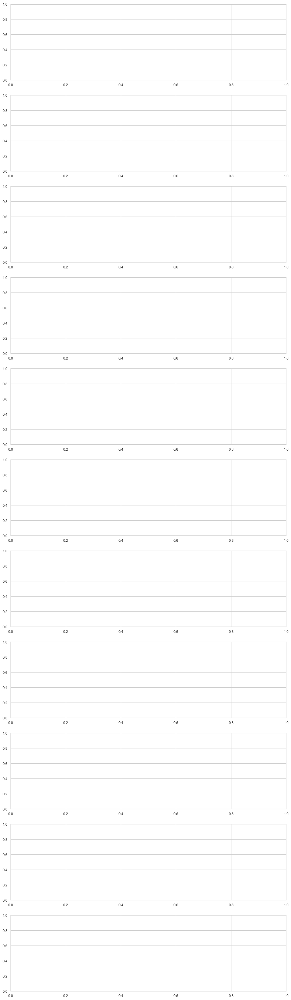

In [32]:
fig, axes = plt.subplots(nrows=len(cg_2), ncols=1, 
                         figsize=(15, len(cg_2)*5))
order = 0
for k, v in cg_2.items():
    v['table_result'], v['error_int_holt'], v['error_int_winters'] = compare_result(
        df, k, v.get('result'), order, axes)
    order += 1

## CALLAO

In [ ]:
%%time
from tqdm import tqdm_notebook

for k, v in dicc_callao.items():
    v['data_cut'] = v.get('data_cut').apply(lambda val: 0.1 if val <= 0 else val)
    
    p, q, P, Q = optimizeSARIMA(
        v.get('data_cut'), parameters_list, d, D, s)
    
    if not all([p, q, P, Q]):
        print("ERROR EN METODO ", k)
        continue
        
    print("Canilla : ", k, " --> ", p, ' 1 ', q, P,' 1 ', Q, s)
    model = sm.tsa.statespace.SARIMAX(
         v.get('data_cut'), order=(p, d, q), seasonal_order=(P, D, Q, s)
    ).fit()
    
    lendata = v.get('data_cut').shape[0]
    forecast = model.predict(start=lendata, end=lendata + 6)
    v['result'] = forecast

In [ ]:
callao_data_2 = {k:v for k, v in dicc_callao.items() if 'result' in v.keys()}
len(callao_data_2)

In [ ]:
"""
fig, axes = plt.subplots(nrows=len(dicc_callao), ncols=1, 
                         figsize=(15, len(dicc_callao)*5))
order = 0
for k, v in callao_data_2.items():
    v['table_result'], v['error_int_holt'], v['error_int_winters'] = compare_result(
        df, k, v.get('result'), order, axes)
    order += 1
"""

## RESUMEN 

In [ ]:
print('HOLT', sum([v.get('error_int_holt', 0) for k, v in callao_data.items()]))

In [ ]:
print('WINTERS', sum([v.get('error_int_winters', 0) for k, v in dicc_callao.items()]))